# Reading a Buffer

This jupyter notebook reads a buffer and plots all it's attributes over the event numbers. You can use whichever buffer you want by simply selecting a data file and tweaking the appropriate parameters on the setup block below

In [1]:
# import necessary modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import to_hex
from matplotlib.ticker import AutoMinorLocator
import numpy as np
import os

import raadpy as rp

# Define some constants
# raw_dir = '../../Data/RAW/'
SD      = '2022-09-15'
raw_dir = '../../Data/Light-1/light1-'+SD+'/'

# Get the subfiles and put the in a dictionary
fnames      = os.listdir(raw_dir)
filenames   = {}
for i in range(1,10): 
    res = [name for name in fnames if f'buff{i}' in name]
    if len(res)>0: filenames[f'buff{i}'] = res[0]

print(filenames)
%matplotlib widget

{'buff1': 'light1-2022-09-15-buff1.dat', 'buff2': 'light1-2022-09-15-buff2.dat', 'buff3': 'light1-2022-09-15-buff3.dat', 'buff4': 'light1-2022-09-15-buff4.dat', 'buff5': 'light1-2022-09-15-buff5.dat', 'buff6': 'light1-2022-NA-NA-buff6.dat', 'buff7': 'light1-2022-NA-NA-buff7.dat', 'buff8': 'light1-2022-NA-NA-buff8.dat', 'buff9': 'light1-2022-NA-NA-buff9.dat'}


# Orbit Buffer Data

First we collect the data from the orbit buffer, then we split based on the detector id and then plot

In [2]:
# Directory of the buffer
# buffer_fname    = raw_dir + SD + '/light1-'+SD+'-buff1.dat'
# Or:
buffer_fname    = raw_dir + filenames['buff1']

# Decode the buffer data in a dictionary
data_SiPM   = rp.get_dict(buffer_fname,struct=rp.ORBIT_STRUCT,condition="data['id_bit'] == 1")
data_PMT    = rp.get_dict(buffer_fname,struct=rp.ORBIT_STRUCT,condition="data['id_bit'] == 0")

Line:   0%|          | 0/2572 [00:00<?, ?it/s]

Line:   0%|          | 0/2572 [00:00<?, ?it/s]

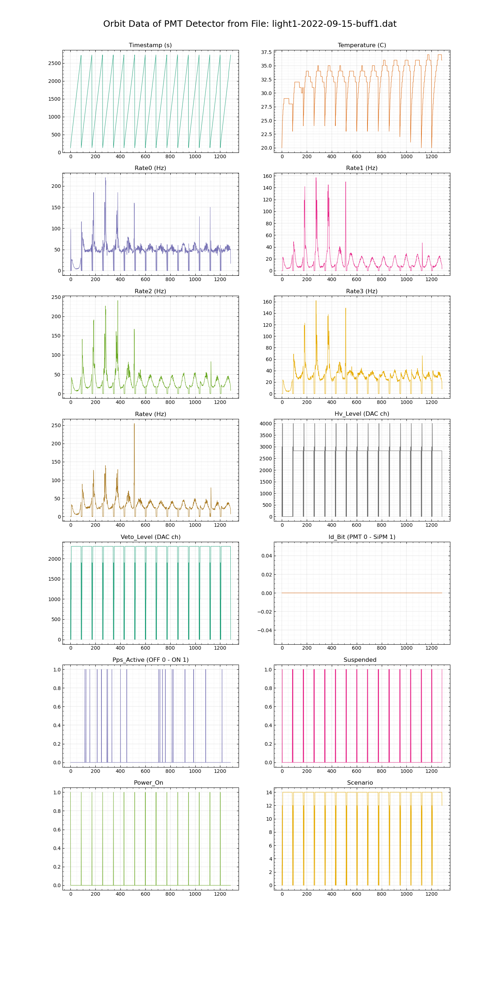

In [3]:
# Now print the PMT Data
fig, axes  = rp.plot_buffer(data_PMT,title = 'Orbit Data of PMT Detector from File: '+ filenames['buff1'],UNITS=rp.ORBIT_UNITS)

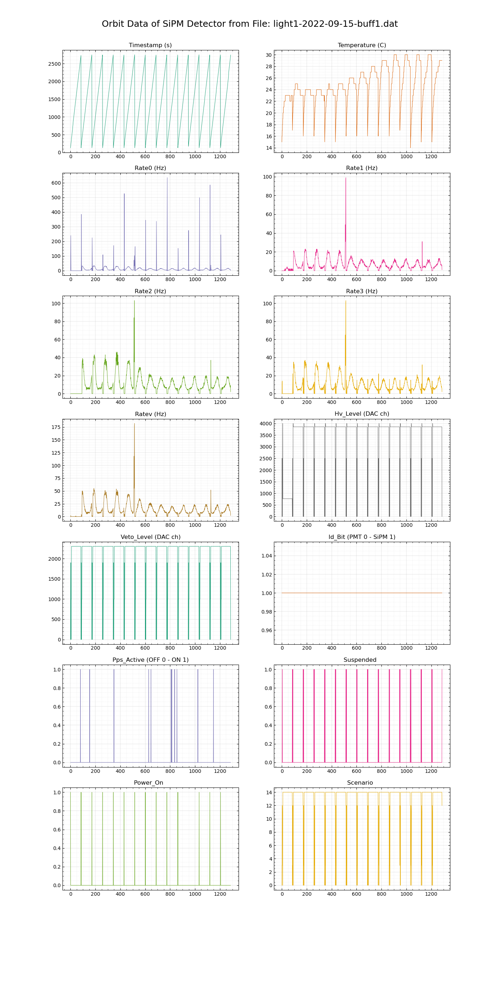

In [4]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM, title = 'Orbit Data of SiPM Detector from File: '+ filenames['buff1'],UNITS=rp.ORBIT_UNITS)

# Veto Buffer Data

We collect both the PMT and SiPM data from the Veto buffers and then plot

In [5]:
# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff6']

# Decode the buffer data in a dictionary
data_SiPM_v     = rp.get_dict(buffer_fname,struct=rp.VETO_STRUCT,MAX=None,STUPID=True)

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff7']

# Decode the buffer data in a dictionary
data_PMT_v      = rp.get_dict(buffer_fname,struct=rp.VETO_STRUCT,MAX=None,STUPID=True,VERIFY=True,threshold=3000*10000)

Line: : 0it [00:00, ?it/s]

Line: : 0it [00:00, ?it/s]

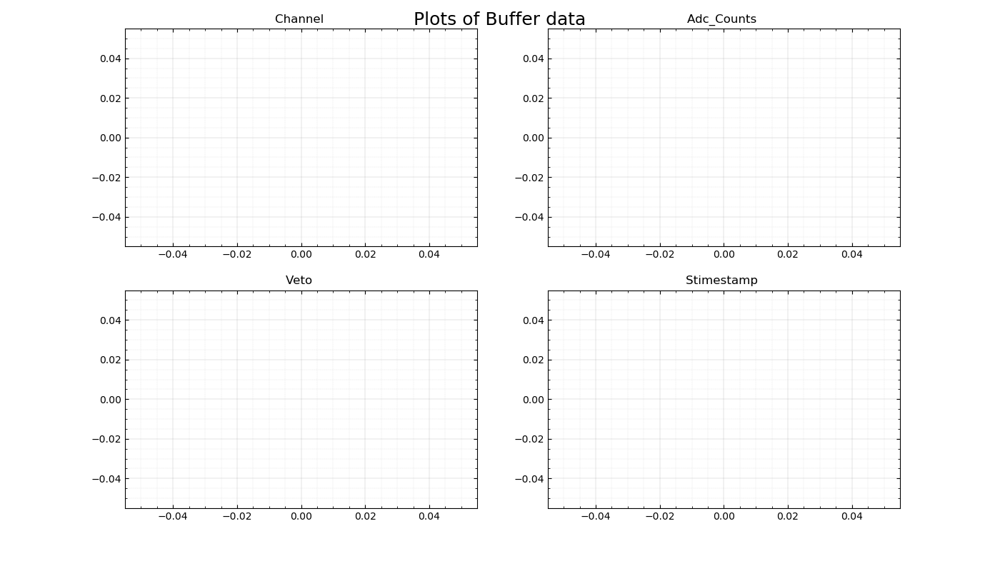

In [6]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_v)

In [7]:
# Plot histograms
fig,ax = rp.plot_hists(data_SiPM_v,struct=rp.VETO_STRUCT)

ValueError: Number of rows must be a positive integer, not 0

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

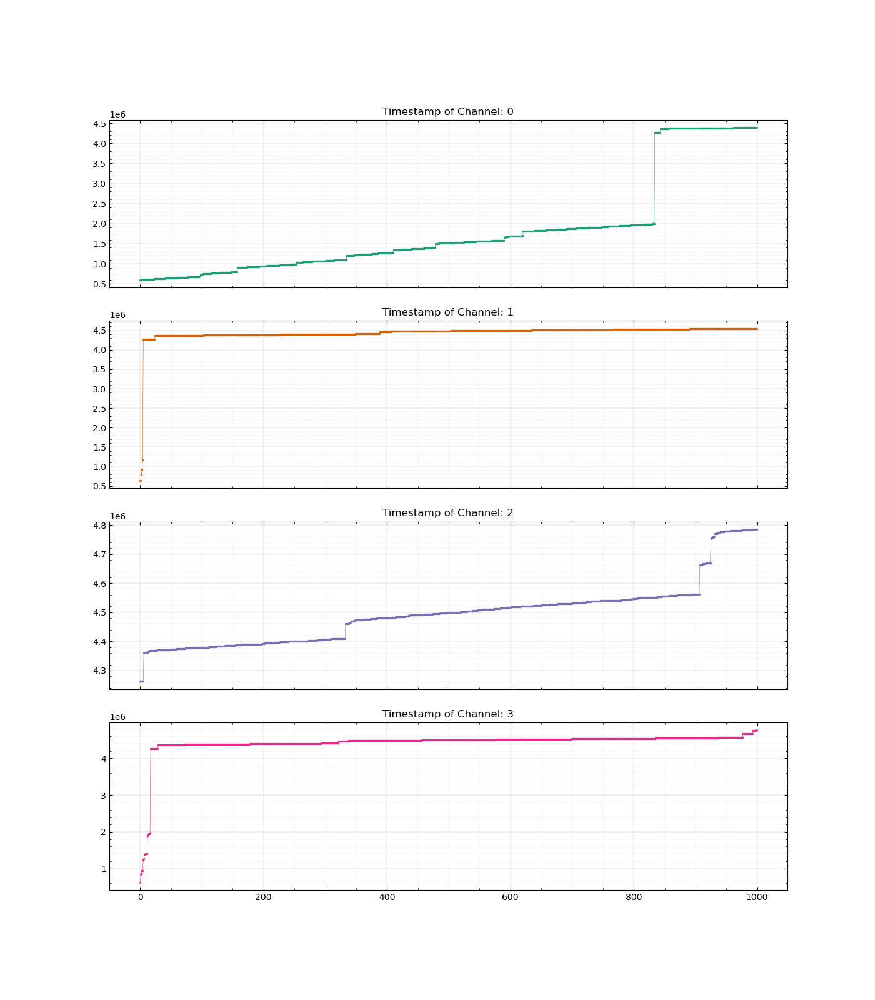

In [ ]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_SiPM_v,RANGE=(0,1000),struct=rp.VETO_STRUCT)

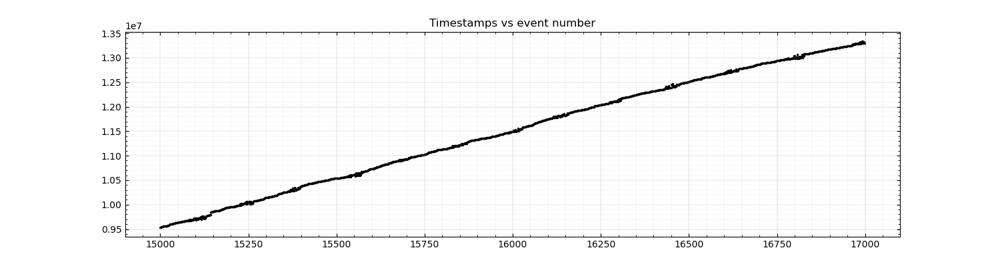

In [ ]:
# Plot timestamps of all events
fig,ax = rp.plot_timestamp(data_SiPM_v,RANGE=(15000,17000))

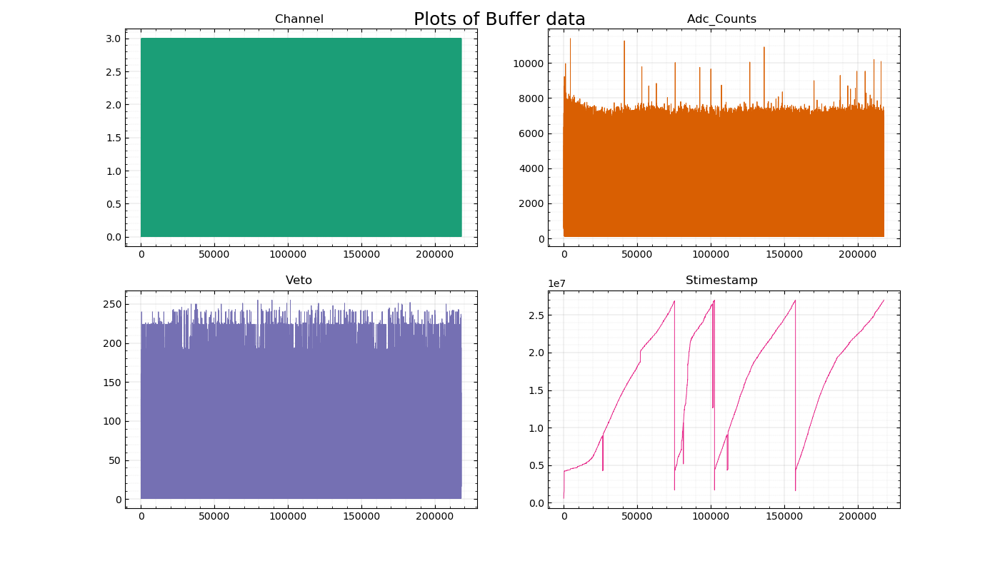

In [ ]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_v)

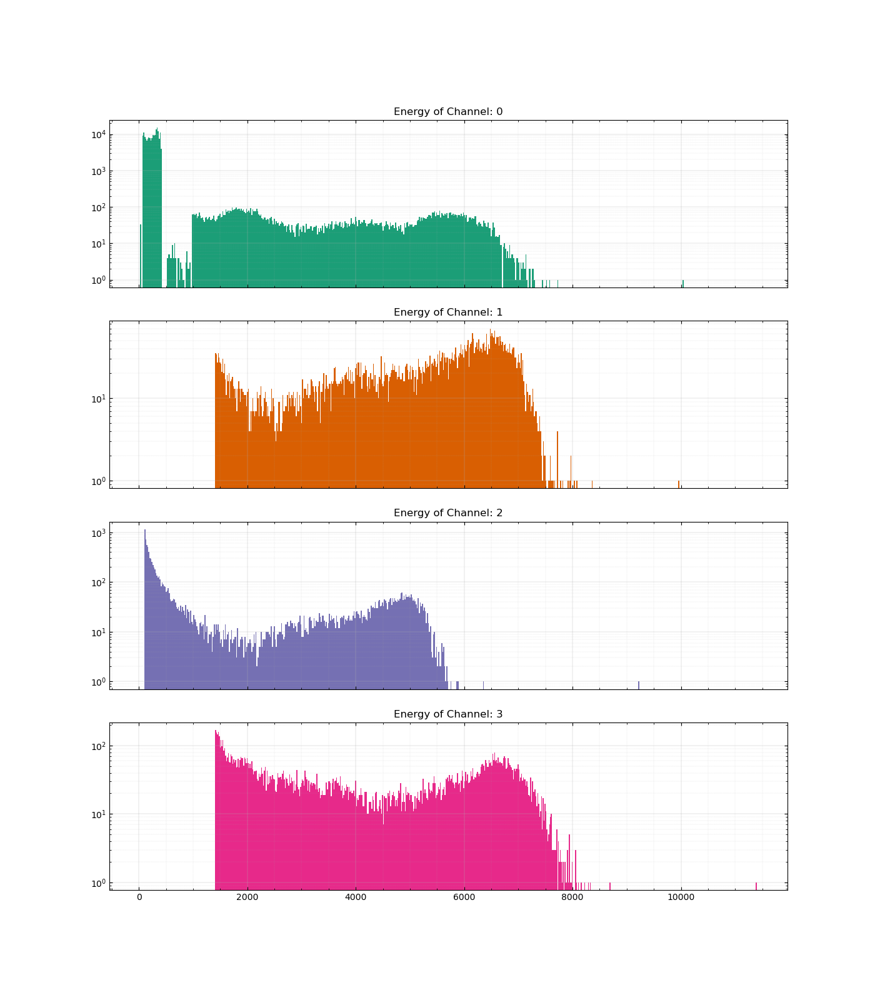

In [ ]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_v,struct=rp.VETO_STRUCT)

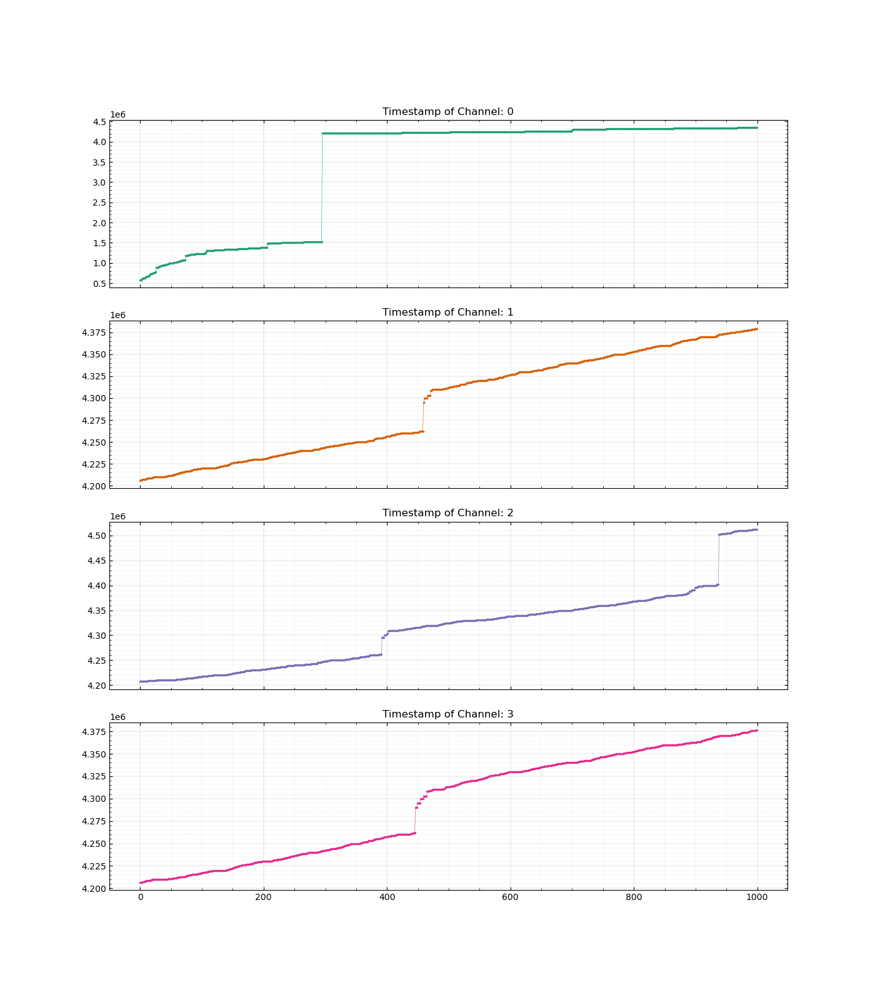

In [ ]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_PMT_v,RANGE=(0,1000),struct=rp.VETO_STRUCT)

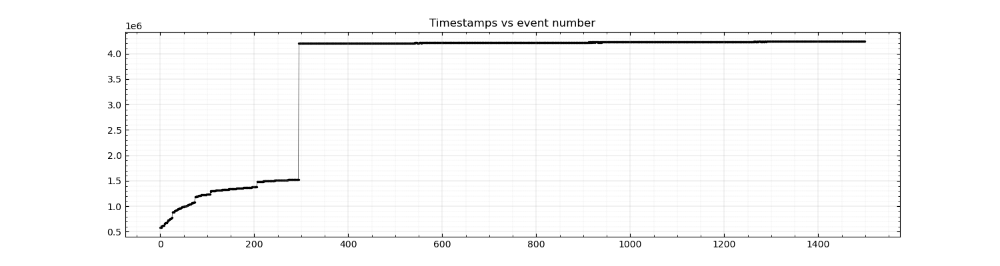

In [ ]:
# Plot timestamps of all events
fig,ax = rp.plot_timestamp(data_PMT_v,RANGE=(0,1500))

# Non Veto Buffer Data

We collect both the PMT and SiPM data from the NON Veto buffers and then plot

In [31]:
# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff4']

MAX = 0
for i in range(rp.NONVETO_STRUCT['stimestamp']+1):MAX += 2**i

# data_SiPM_nv    = rp.get_dict(buffer_fname,struct=rp.NONVETO_STRUCT,STUPID=True,MAX=10000000)

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff5']

# Decode the buffer data in a dictionary
data_PMT_nv     = rp.get_dict(buffer_fname,struct=rp.NONVETO_STRUCT,STUPID=True,VERIFY=True,threshold=3000*1e3,MAX=2000000)#,condition=f"data['stimestamp'] <= {5e6}")


Line:   0%|          | 0/837297 [00:00<?, ?it/s]

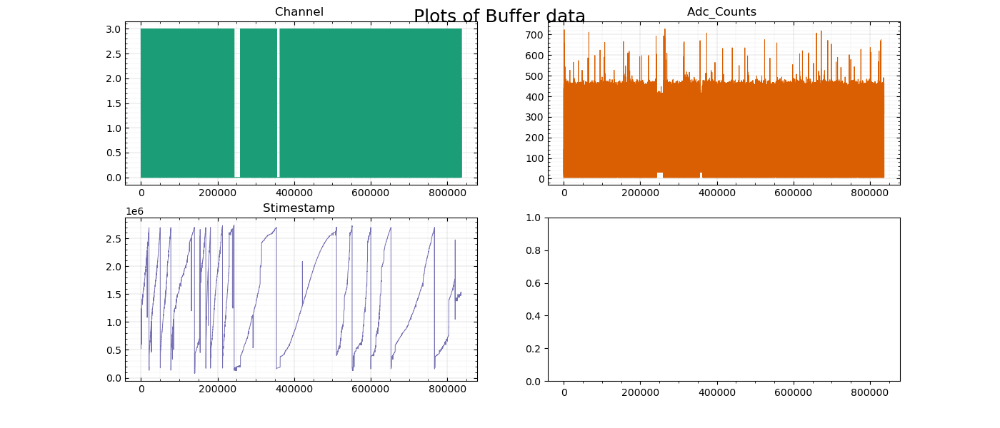

In [32]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_PMT_nv)

/Users/panos/Documents/NYU/6.Extracurricular/23.Cubesat/raad/raadpy/src/raadpy/plotting.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax  = plt.subplots(len(channels),1,figsize=(14,4*len(channels)),dpi=100,sharex=True)


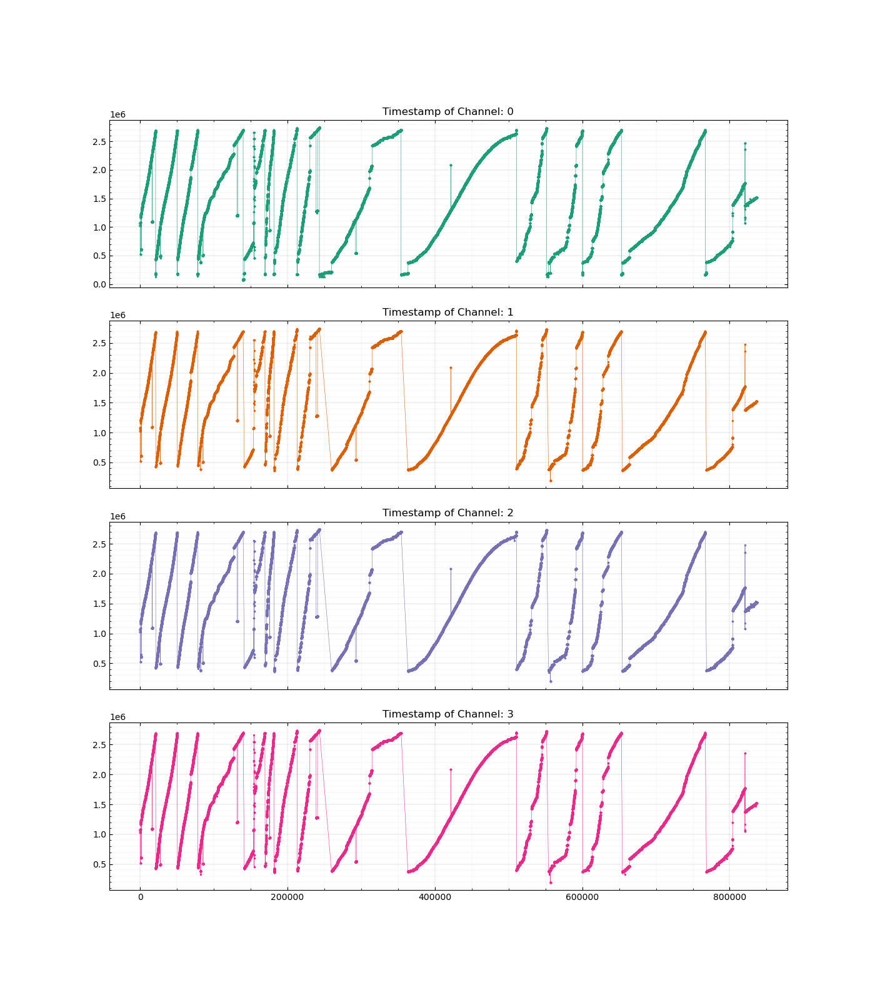

In [33]:
rp.plot_timestamps(data_PMT_nv,rp.NONVETO_STRUCT);

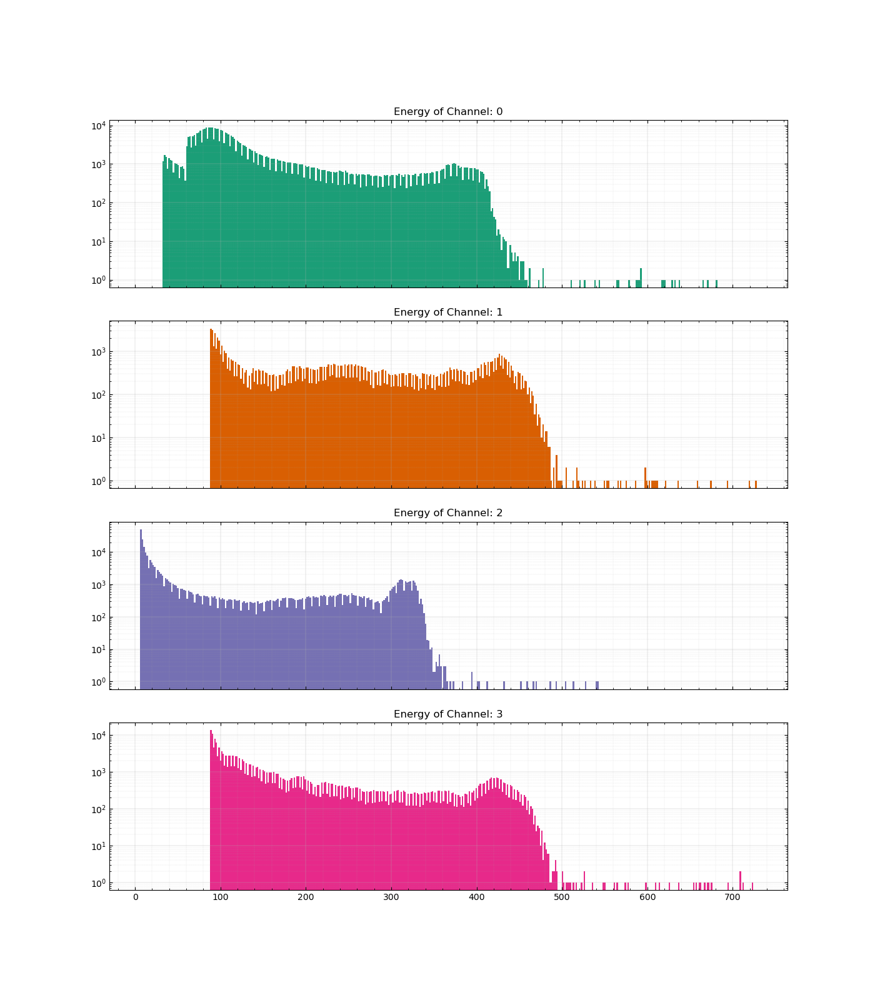

In [34]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_nv,struct=rp.NONVETO_STRUCT,bins=400)

In [35]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_SiPM_nv,struct=rp.NONVETO_STRUCT)

NameError: name 'data_SiPM_nv' is not defined

In [ ]:
# Plot timestamps of all events
fig, ax = rp.plot_timestamp(data_SiPM_nv)

NameError: name 'data_SiPM_nv' is not defined

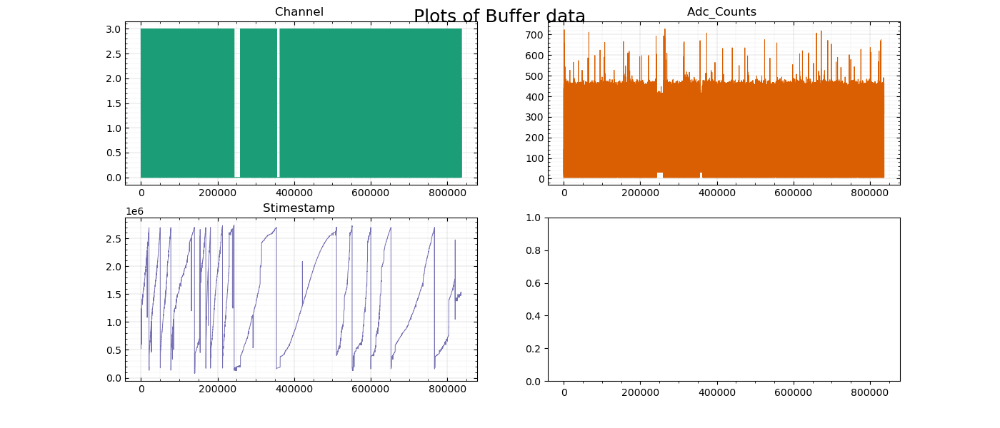

In [36]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_nv)

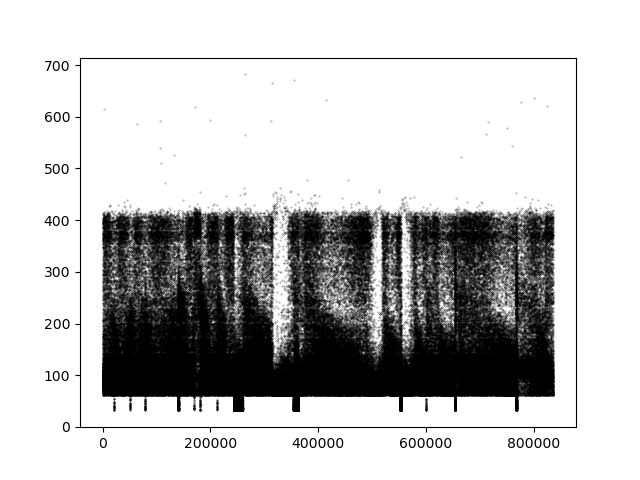

In [41]:
D,cnts = rp.split_channels(data_PMT_nv,struct=rp.NONVETO_STRUCT)
c = 0
figure = plt.figure()
plt.scatter(cnts[c],D[c]['adc_counts'],s=0.1,c='k',alpha=0.5)


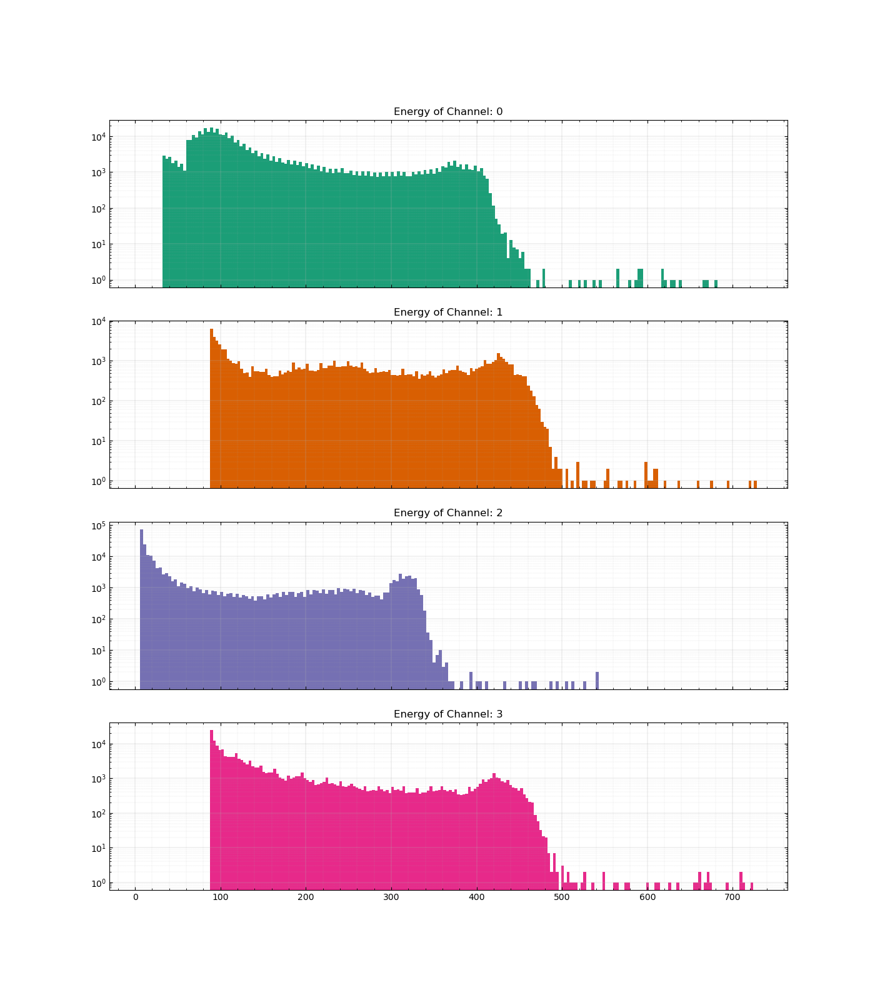

In [39]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_nv,struct=rp.NONVETO_STRUCT,bins=200)

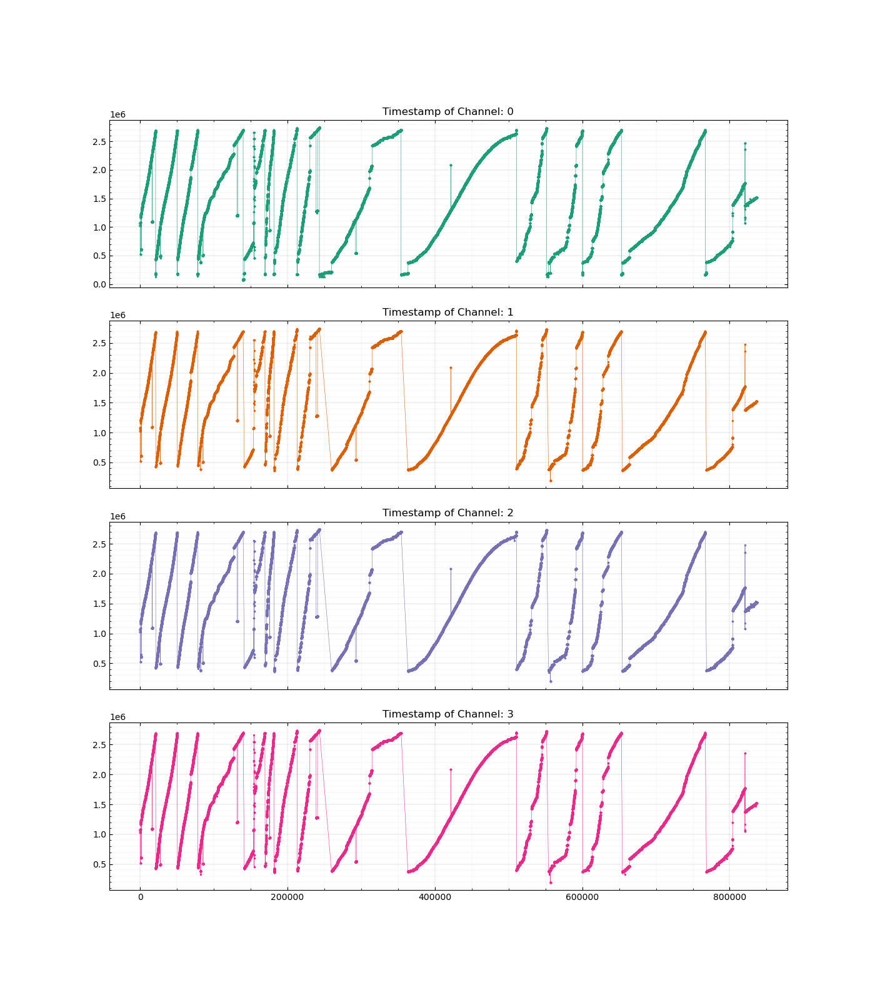

In [40]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_PMT_nv,struct=rp.NONVETO_STRUCT)

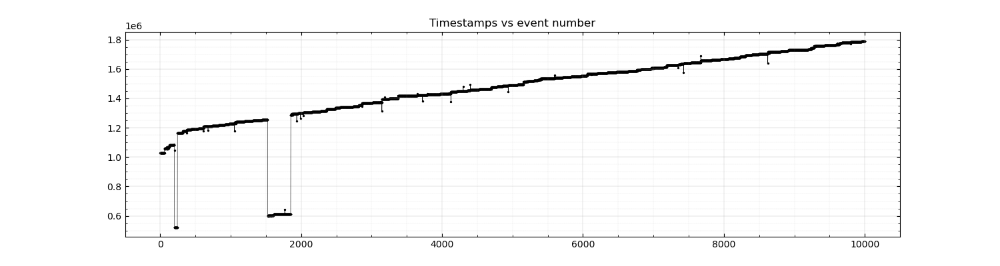

In [42]:
# Plot timestamps of all events
fig, ax = rp.plot_timestamp(data_PMT_nv,RANGE=(0,10000))

# TGF Buffers

We collect both the PMT and SiPM data from the TGF buffers and then plot

In [ ]:
# Define a dictionary
TGF_STRUCT={
    'stimestamp': 48,
    'adc_counts': 14,
    'channel': 2,
}

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff2']

MAX = 281474976710656

# Decode the buffer data in a dictionary
data_SiPM_tgf    = rp.get_dict(buffer_fname,struct=TGF_STRUCT,VERIFY=True,threshold = 5e9)#,condition=f"data['stimestamp'] <= {MAX*0.09}")

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff3']

# Decode the buffer data in a dictionary
data_PMT_tgf     = rp.get_dict(buffer_fname,struct=TGF_STRUCT,VERIFY=True,threshold = 5e90,STUPID=False)#,condition=f"data['stimestamp'] <= {MAX*0.09}")

Line:   0%|          | 0/3096 [00:00<?, ?it/s]

Line:   0%|          | 0/22610 [00:00<?, ?it/s]

In [ ]:
# Change the timestamp to mission time
def to_mission_time(data:dict):
    """Converts data to mission time from the TGF Buffer

    Args:
        data (dict): The data read directly from NA
    """
    subsecond_field = np.array([int(datum) & ((1 << 22) - 1)                        for datum in data['stimestamp']])
    second_field    = np.array([(int(datum) & (((1 << 26) - 1) << 22) >> 22) * 2e6  for datum in data['stimestamp']])

    data['stimestamp'] = second_field + subsecond_field

    return data['stimestamp']

# to_mission_time(data_PMT_tgf);
# to_mission_time(data_SiPM_tgf);

In [ ]:

from unicodedata import decimal


print('%e'%int('ffa63d480000',base=16))

2.810895e+14


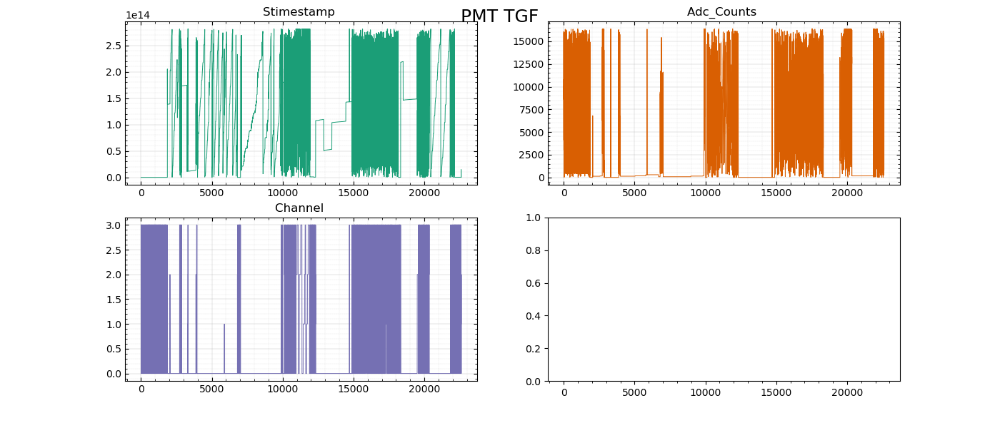

In [ ]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_tgf,title='PMT TGF')

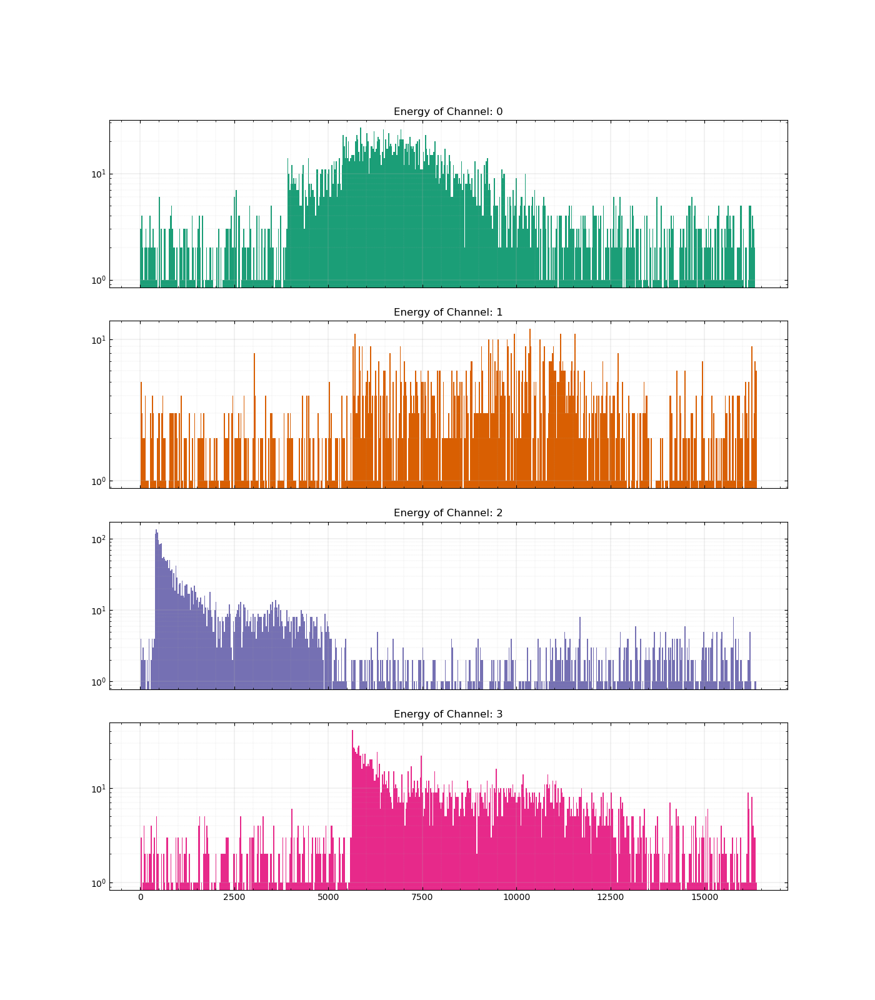

In [ ]:
rp.plot_hists(data_PMT_tgf,struct=TGF_STRUCT);

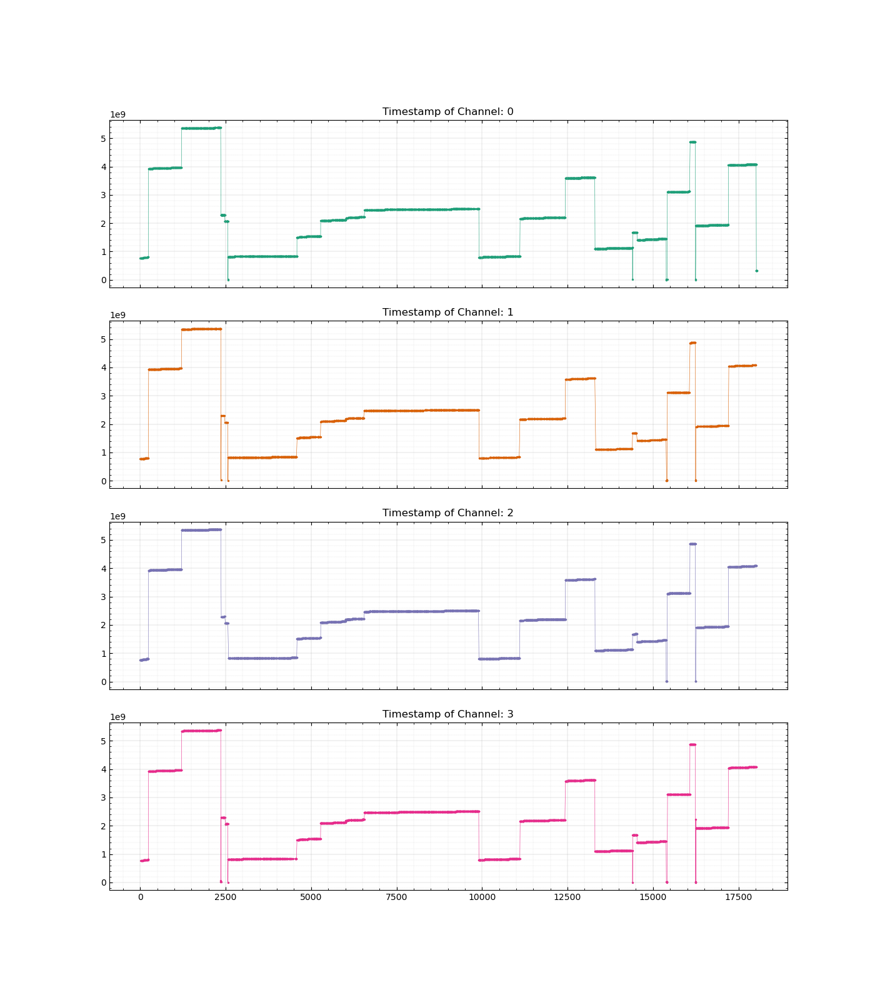

In [ ]:
rp.plot_timestamps(data_PMT_tgf,struct=TGF_STRUCT);

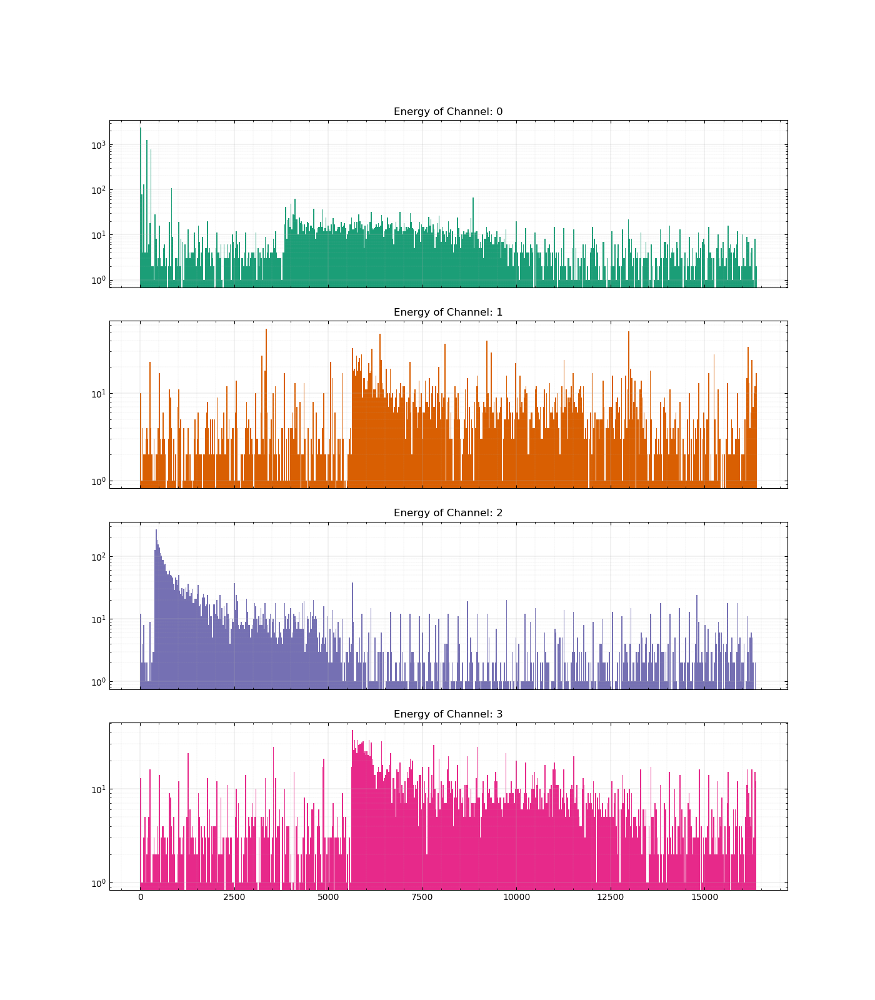

In [ ]:
# rp.plot_hists(data_PMT_tgf);

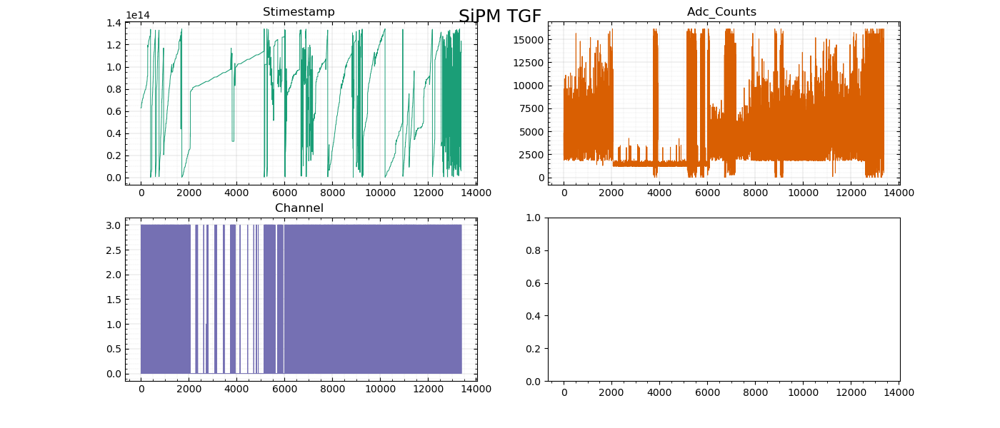

In [ ]:
# Now print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_tgf,title='SiPM TGF')

In [ ]:
rp.TGF_STRUCT

{'stimestamp': 48, 'channel': 2, 'adc_counts': 14}

In [ ]:
def get_consecutive_timestamps(data,gt=0, VERBOSE=True):
    unique_times, unique_freq = np.unique(data['stimestamp'],return_counts=True)
    idx = np.where(unique_freq>gt)[0]
    times = unique_times[idx]

    if VERBOSE:
        print(len(times))
        for i,j in zip(unique_freq[idx],times):
            print("%2d\t%.1f"%(i,j))

    return times, unique_freq[idx]

# times, freq = get_consecutive_timestamps(data_PMT_tgf,3)

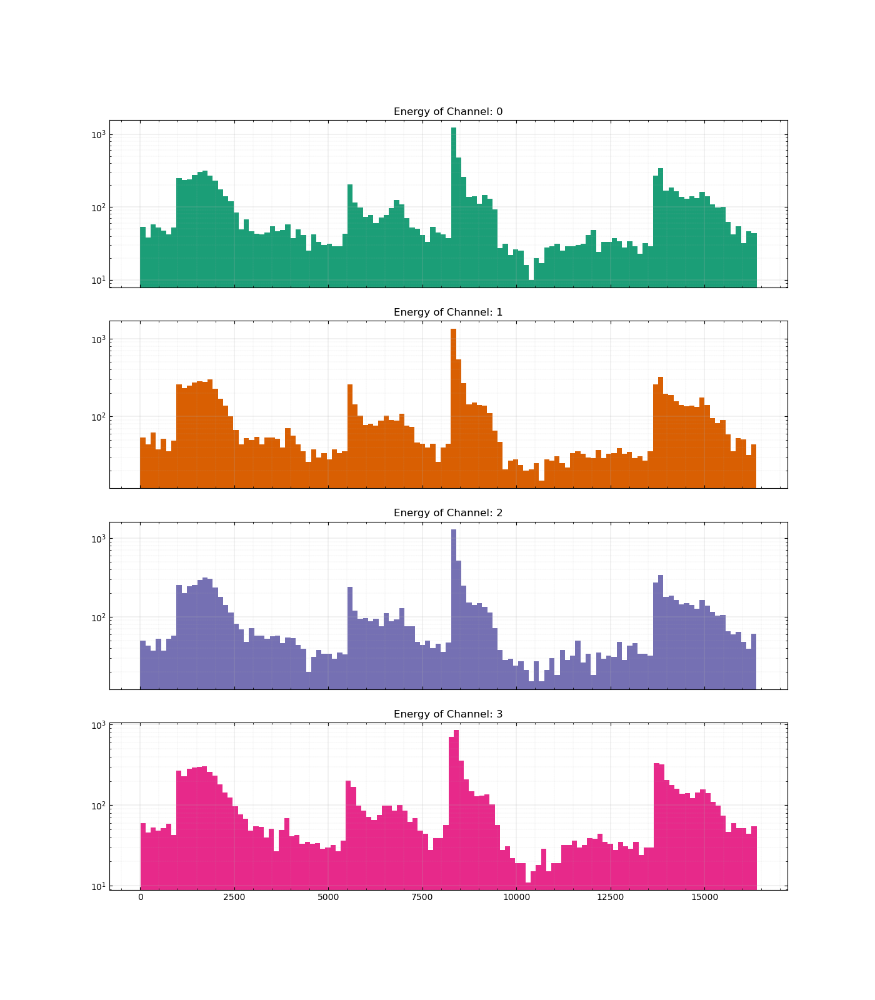

In [ ]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_tgf,struct=TGF_STRUCT,bins=120)

In [ ]:
750/(2*60**2)

0.10416666666666667

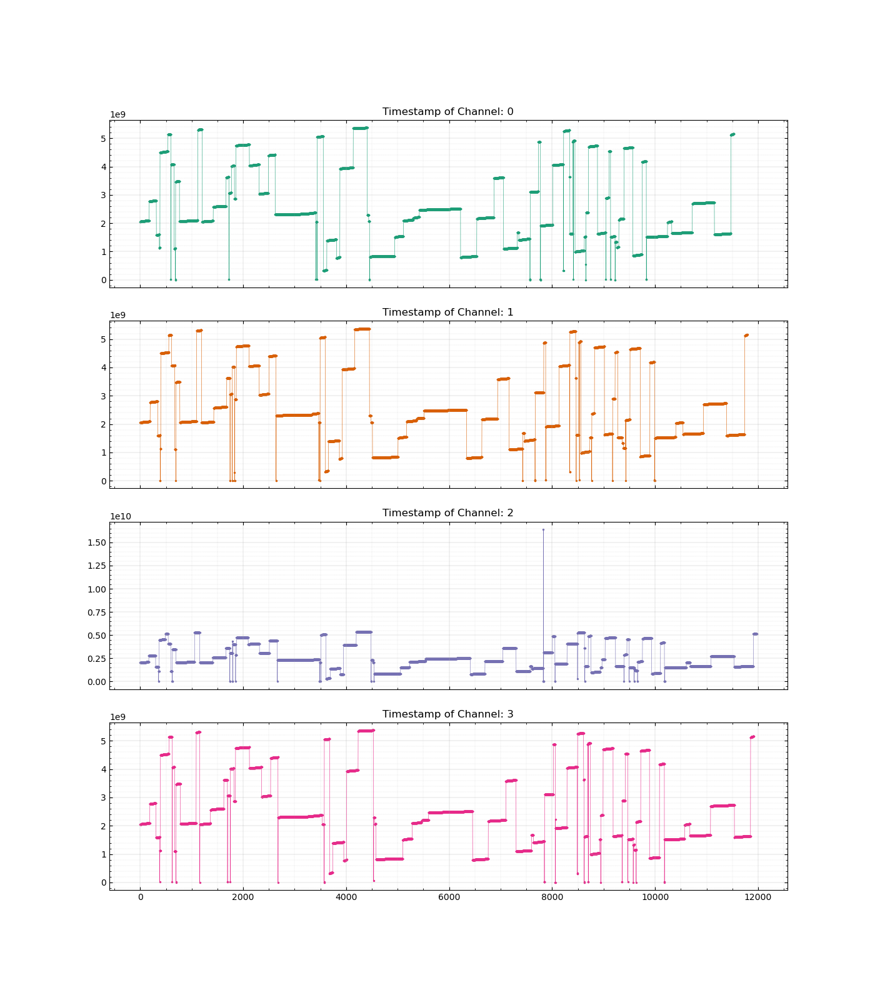

In [ ]:
fig,ax = rp.plot_timestamps(data_PMT_tgf,struct=TGF_STRUCT)

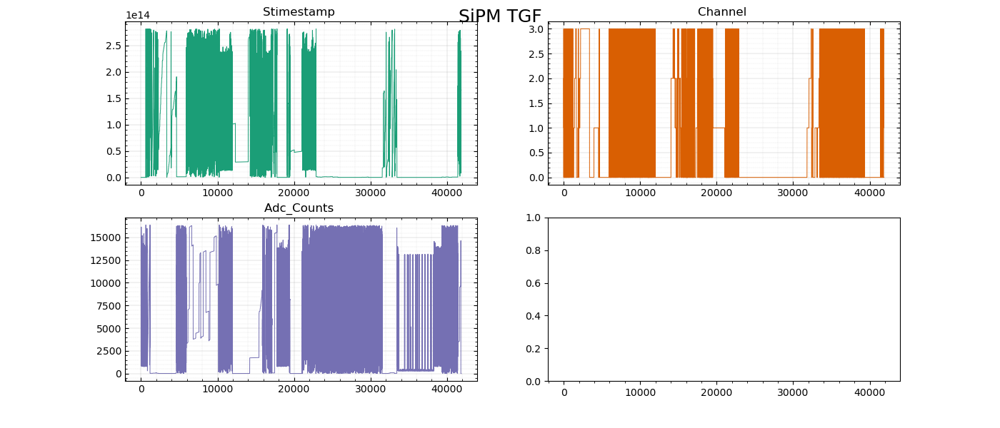

In [ ]:
# Now print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_tgf,title='SiPM TGF')

In [ ]:
times, freq = get_consecutive_timestamps(data_SiPM_tgf,3)

168
 5	321999999.0
75	323999999.0
76	325999999.0
78	327999999.0
79	329999999.0
79	331999999.0
79	333999999.0
77	335999999.0
40	345999999.0
75	347999999.0
77	349999999.0
78	351999999.0
79	353999999.0
78	355999999.0
81	357999999.0
64	465999999.0
 6	1179999999.0
 6	1181999999.0
 5	1187999999.0
12	1189999999.0
 8	1191999999.0
 5	1195999999.0
 5	1197999999.0
11	1199999999.0
 6	1201999999.0
 9	1203999999.0
 6	1209999999.0
11	1211999999.0
 5	1319999999.0
 5	1323999999.0
14	1325999999.0
10	1949999999.0
16	1951999999.0
 7	1953999999.0
 7	1955999999.0
11	1957999999.0
 9	1959999999.0
13	1961999999.0
 8	1963999999.0
 7	1965999999.0
 9	1969999999.0
 5	1971999999.0
 8	1973999999.0
12	1977999999.0
14	1979999999.0
 7	1981999999.0
 4	1983999999.0
 7	1985999999.0
 6	1987999999.0
 5	2243999999.0
 6	2245999999.0
 5	2263999999.0
11	2307999999.0
12	2311999999.0
 6	2315999999.0
10	2317999999.0
18	2319999999.0
16	2323999999.0
 4	2327999999.0
 8	2335999999.0
 6	2337999999.0
 7	2339999999.0
 4	2341999999.0
12	2

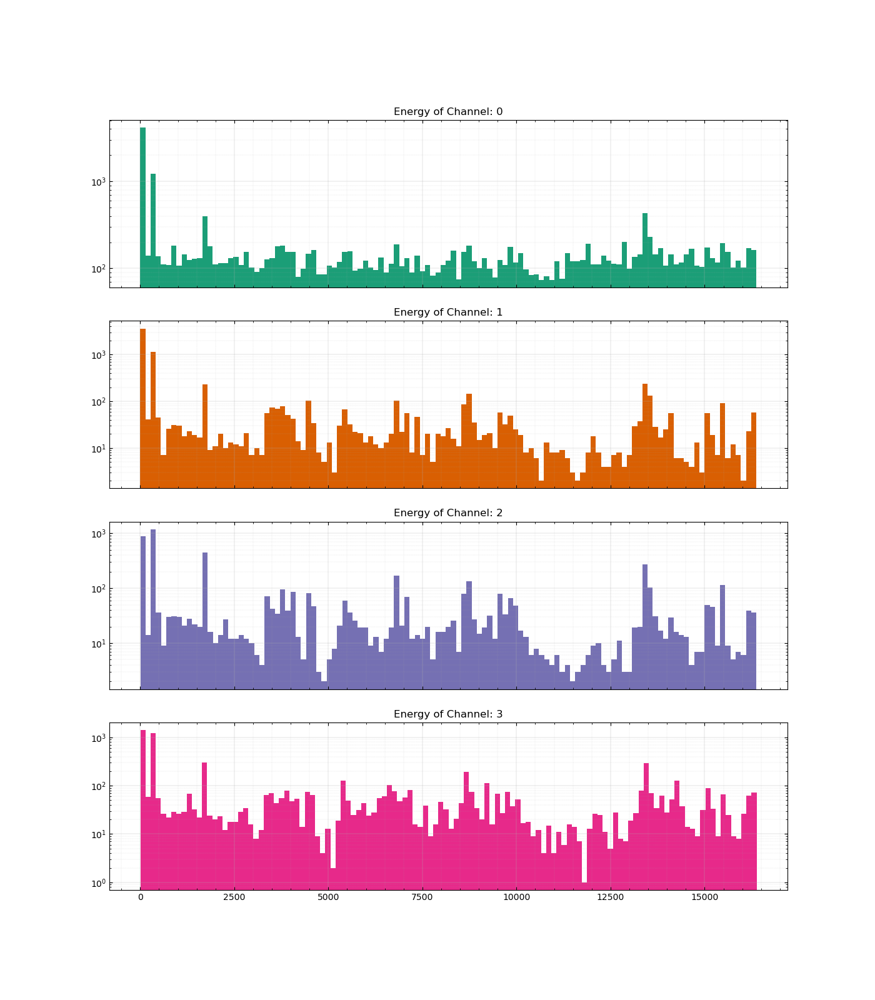

In [ ]:
# Plot histograms
fig,ax = rp.plot_hists(data_SiPM_tgf,struct=TGF_STRUCT,bins=120)

In [ ]:
print(rp.NONVETO_STRUCT)

{'channel': 2, 'adc_counts': 10, 'stimestamp': 36}


In [ ]:
rp.ORBIT_STRUCT

{'timestamp': 32,
 'temperature': 8,
 'rate0': 12,
 'rate1': 12,
 'rate2': 12,
 'rate3': 12,
 'ratev': 8,
 'hv_level': 12,
 'veto_level': 12,
 'id_bit': 1,
 'pps_active': 1,
 'suspended': 1,
 'power_on': 1,
 'scenario': 4}